# Planning Stage (Myra Tyagi)

In [1]:
#Loading required libraries
library(tidyverse)
library(repr)
library(infer)
library(cowplot)
library(broom)
library(dplyr)
library(ggplot2)
library(GGally)
library(car)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some




### 1. Data Description

The dataset chosen provides a comprehensive summary of Airbnb prices in 3 of the most popular cities in Europe: London, Rome and Budapest. This dataset has been extracted from Kaggle (source: https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities). The information in this data has been collected through web-scraping (source: https://zenodo.org/record/4446043#.Y9Y9ENJBwUE).

There are 6 csv files (3 cities x 2 day types) in total, accessible through the folder raw_data. These are:
1. london_weekdays.csv: 4614 observations
2. london_weekends.csv: 5379 observations
3. budapest_weekdays.csv: 2074 observations
4. budapest_weekends.csv: 1948 observations
5. rome_weekdays.csv: 4492 observations
6. rome_weekends.csv: 4535 observations

They all have the same variables (19 in total) as listed below:

|Name|Type|Description|
|:---|:---|:----------|
|realSum|Numeric|The total price of the airbnb listing in EUR|
|room_type|Categorical|The type of room being offered|
|room_shared|Boolean|Whether the room is shared or not|
|room_private|Boolean|Whether the room is private or not|
|person_capacity|Numeric|The maximum number of people that can stay in the room|
|host_is_superhost|Boolean|Whether the host is a superhost or not|
|multi|Numeric|Whether the listing is for multiple rooms or not|
|biz|Numeric|Whether the listing is for business purposes or not|
|cleanliness_rating|Numeric|The cleanliness rating of the listing|
|guest_satisfaction_overall|Numeric|The overall guest satisfaction rating of the listing|
|bedroom|Numeric|The number of bedrooms in the listing (0 if it is a studio)|
|dist|Numeric|The distance from the city centre in km|
|metro_dist|Numeric|The distance from the nearest metro station in km|
|attr_index|Numeric|Attraction index of the listing location|
|attr_index_norm|Numeric|Normalised attraction index (0-100)|
|rest_index|Numeric|Restaurant index of the listing location|
|rest_index_norm|Numeric|Normalised restaurant index (0-100)|
|lng|Numeric|The longitude of the listing|
|lat|Numeric|The latitude of the listing|

**NOTE**: 
1. The description of 4 variables including `attr_index`, `attr_index_norm`, `rest_index` and `rest_index_norm` have not been provided on Kaggle. They have been extracted from the original source (Zenodo).
2. While `multi` and `biz` are dummy variables, they are of type numeric. They have been converted into factors in the data wrangling section

I additionally added two variables to the final combined dataset: 
|Name|Type|Description|
|:---|:---|:----------|
|city|Categorical|The city the listing belongs to|
|weekend|Boolean|Whether the listing is for a weekend or not|

### 2. Question

The question I have chosen to analyse is:
How is the price of an Airbnb listing affected by its distance from the city centre, the weekend status and the city it belongs to?

**Response variable**: `realSum`  
**Explanatory variables**: `dist`, `weekend` and `city`

This question seeks to explore the relationship between the price of an airbnb listing and its location, while accounting for potential price differences on weekends and weekdays. A model based on this can help us address various questions like:
1. Whether listings closer to the city centre tend to have a higher price.
2. Whether prices generally increase on weekends, and if it varies across cities.

This question is focused on inference and prediction:
1. **Inference**: To determine if the associations between price, distance, city and weekend status are statistically significant.
2. **Prediction**: To estimate how much the price will change depending on how far a listing is from the city center and which city it belong to, or if it’s booked on a weekend.

With such a comprehensive dataset as the one selected for this project, I believe we can gain a lot of insight into this question.

### 3. Exploratory Data Analysis

#### Loading the dataset in R
I added all the required csv files to Github and then cloned them in Jupyter under the file named **raw_data**. I then proceded to combine all the files into a single dataset called combined_data, found in the file called **new_data**.

In [2]:
#Listing all CSV files in the directory
all_files <- c("london_weekdays.csv",
              "london_weekends.csv",
              "budapest_weekdays.csv",
              "budapest_weekends.csv",
              "rome_weekdays.csv",
              "rome_weekends.csv")


combined_data <- lapply(all_files, function(file) {
    dataframe <- read_csv(paste0("raw_data/", file))

    #Extract the city names from the dataset title
    city <- str_extract(file, "^[^_]+")

    #Extract weekend information from the dataset title
    weekend <- str_detect(file, "weekends")

    #Combine the new columns with the datasets
    new_cols <- mutate(dataframe,
                       city = as.factor(city),
                       weekend = as.logical(weekend))
    return(new_cols)
    }) %>%

#Combine all the datasets together
bind_rows()

#Remove futile variables
combined_data <- combined_data |>
select(-...1)

#Gives dimensions of the combined dataset
dim(combined_data)

#Shows first 6 rows of the dataset
head(combined_data)

#Display all the columns in the data frame
glimpse(combined_data)

#Writing the data in a csv file
write.csv(combined_data, "new_data/combined_data.csv", row.names = FALSE)

New names:
• `` -> `...1`
Rows: 4614 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 5379 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 2074 Columns: 20
── Column specification ─────────────────

[1] 23042    21

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,weekend
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<lgl>
570.0981,Entire home/apt,FALSE,FALSE,2,FALSE,0,0,10,98,⋯,5.301018,1.5889904,209.6326,14.57179,467.5975,8.372724,-0.16032,51.46531,london,FALSE
297.9844,Private room,FALSE,TRUE,2,TRUE,1,0,10,99,⋯,2.198946,0.3792620,553.8917,38.50163,961.4721,17.215961,-0.09683,51.50343,london,FALSE
336.7906,Private room,FALSE,TRUE,2,FALSE,1,0,10,96,⋯,2.322958,0.4531776,428.2878,29.77076,959.0428,17.172462,-0.10554,51.52407,london,FALSE
226.7222,Private room,FALSE,TRUE,2,TRUE,1,0,10,99,⋯,5.707825,1.7239771,195.6947,13.60296,452.2325,8.097600,-0.16575,51.46292,london,FALSE
256.3560,Private room,FALSE,TRUE,3,FALSE,0,0,9,98,⋯,3.257945,0.8254172,329.4771,22.90232,735.3273,13.166649,-0.12055,51.53728,london,FALSE
239.8928,Private room,FALSE,TRUE,2,FALSE,0,0,10,100,⋯,5.085730,1.8062181,226.7250,15.75990,486.7371,8.715433,-0.17241,51.47222,london,FALSE


Rows: 23,042
Columns: 21
$ realSum                    <dbl> 570.0981, 297.9844, 336.7906, 226.7222, 256…
$ room_type                  <chr> "Entire home/apt", "Private room", "Private…
$ room_shared                <lgl> FALSE, FALSE, FALSE, FALSE, FALSE, FALSE, F…
$ room_private               <lgl> FALSE, TRUE, TRUE, TRUE, TRUE, TRUE, TRUE, …
$ person_capacity            <dbl> 2, 2, 2, 2, 3, 2, 2, 2, 4, 3, 2, 2, 2, 2, 4…
$ host_is_superhost          <lgl> FALSE, TRUE, FALSE, TRUE, FALSE, FALSE, FAL…
$ multi                      <dbl> 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0…
$ biz                        <dbl> 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1…
$ cleanliness_rating         <dbl> 10, 10, 10, 10, 9, 10, 10, 10, 9, 8, 9, 8, …
$ guest_satisfaction_overall <dbl> 98, 99, 96, 99, 98, 100, 100, 95, 93, 74, 7…
$ bedrooms                   <dbl> 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 3…
$ dist                       <dbl> 5.301018, 2.198946, 2.322958, 5.707825, 3.2…
$ metro_dist   

#### Cleaning and wrangling data
Here, I take all the necessary steps to clean my data including renaming some columns, changing their types, and checking for typos.

In [3]:
#Renaming columns for clarity 
airbnb_data <- combined_data %>%
rename(total_Price = realSum,
      multipleRooms = multi,
      business = biz)

#Change room_type from chr to fct
airbnb_data$room_type <- as.factor(airbnb_data$room_type)
airbnb_data$multipleRooms <- as.factor(airbnb_data$multipleRooms)
airbnb_data$business <- as.factor(airbnb_data$business)

#Checks for typos
unique(airbnb_data$room_type)
unique(airbnb_data$city)


head(airbnb_data)

[1] Entire home/apt Private room    Shared room    
Levels: Entire home/apt Private room Shared room

[1] london   budapest rome    
Levels: london budapest rome

total_Price,room_type,room_shared,room_private,person_capacity,host_is_superhost,multipleRooms,business,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,weekend
<dbl>,<fct>,<lgl>,<lgl>,<dbl>,<lgl>,<fct>,<fct>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<lgl>
570.0981,Entire home/apt,FALSE,FALSE,2,FALSE,0,0,10,98,⋯,5.301018,1.5889904,209.6326,14.57179,467.5975,8.372724,-0.16032,51.46531,london,FALSE
297.9844,Private room,FALSE,TRUE,2,TRUE,1,0,10,99,⋯,2.198946,0.3792620,553.8917,38.50163,961.4721,17.215961,-0.09683,51.50343,london,FALSE
336.7906,Private room,FALSE,TRUE,2,FALSE,1,0,10,96,⋯,2.322958,0.4531776,428.2878,29.77076,959.0428,17.172462,-0.10554,51.52407,london,FALSE
226.7222,Private room,FALSE,TRUE,2,TRUE,1,0,10,99,⋯,5.707825,1.7239771,195.6947,13.60296,452.2325,8.097600,-0.16575,51.46292,london,FALSE
256.3560,Private room,FALSE,TRUE,3,FALSE,0,0,9,98,⋯,3.257945,0.8254172,329.4771,22.90232,735.3273,13.166649,-0.12055,51.53728,london,FALSE
239.8928,Private room,FALSE,TRUE,2,FALSE,0,0,10,100,⋯,5.085730,1.8062181,226.7250,15.75990,486.7371,8.715433,-0.17241,51.47222,london,FALSE


#### Visualization
In this section I have created my main visualizations which include scatterplots displaying the relationship between **log-transformed Airbnb prices** and their **distance** from the city centre. These plots are:
1. Faceted by city
2. Colored by the booking day

The distribution of total_Price is right-skewed, with some listings priced significantly higher than others. To reduce skewness, stabilize variance, and satisfy the assumptions of linear regression (especially homoscedasticity), I applied a log transformation. As such, log(total_Price) is used as the response variable in both visualization and modeling.

`geom_smooth()` using formula = 'y ~ x'


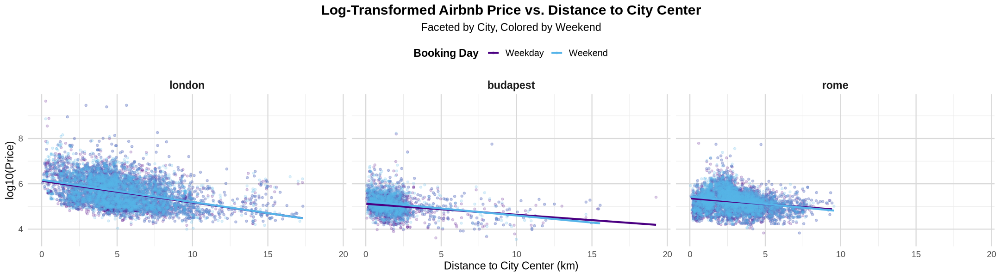

In [4]:
options(repr.plot.width = 18,
        repr.plot.height=5)

#Visualize the log distribution of prices against distance by city and weekend
main_scatterplots <- airbnb_data %>%
ggplot(aes(x = dist, y = log(total_Price), color = weekend)) +
  geom_point(alpha = 0.2, size = 1.2) +
  geom_smooth(method = "lm", se = FALSE, linewidth = 1.2) +
  facet_wrap(~ city, scales="fixed") +
  scale_color_manual(values = c("FALSE" = "#4B0082", "TRUE" = "#56B4E9"),
    labels = c("Weekday", "Weekend")) +
labs(
    title = "Log-Transformed Airbnb Price vs. Distance to City Center",
    subtitle = "Faceted by City, Colored by Weekend",
    x = "Distance to City Center (km)",
    y = "log10(Price)",
    color = "Booking Day"
  ) +
  theme_minimal(base_size = 14)+
theme(
    plot.title = element_text(face = "bold", size = 18, hjust = 0.5),
    plot.subtitle = element_text(size = 14, hjust = 0.5, margin = margin(b = 10)),
    strip.text = element_text(face = "bold", size = 14),
    legend.position = "top",
    legend.title = element_text(face = "bold"),
    legend.text = element_text(size = 12),
    panel.grid.major = element_line(color = "grey85")
  )
main_scatterplots

#### Other Visualizations
Here I have shown some other visualizations for better clarity of the relationship between the variables.

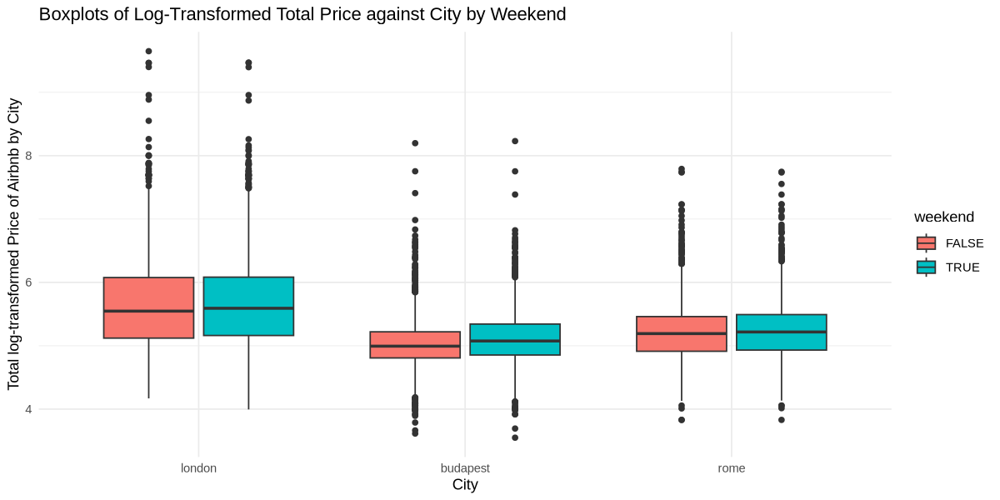

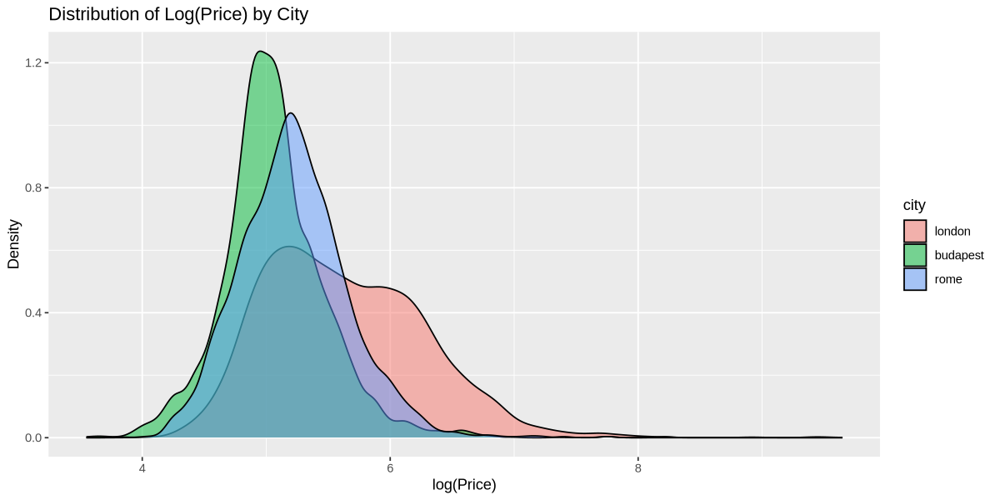

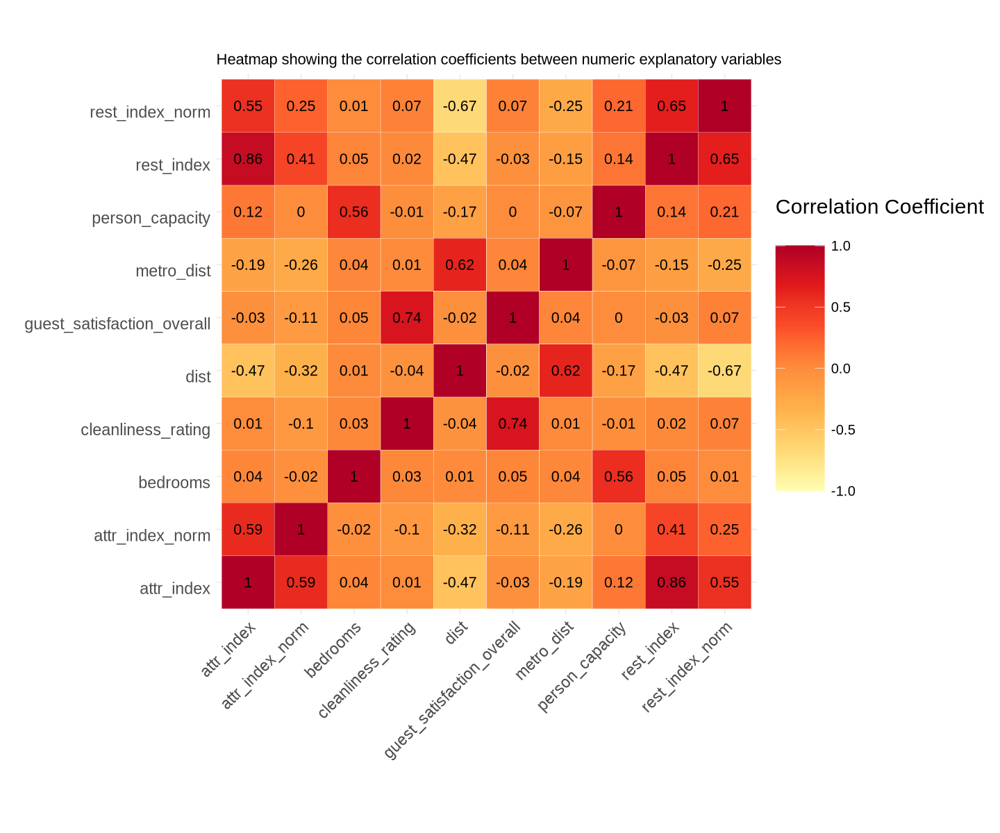

In [6]:
options(repr.plot.width=10, repr.plot.height=5)

#Boxplots showing relationship between log-transformed total price and city by weekend
city_boxplots <- airbnb_data %>%
ggplot()+
geom_boxplot(aes(x=city, y=log(total_Price), fill=weekend)) +
ggtitle("Boxplots of Log-Transformed Total Price against City by Weekend") +
  xlab("City") +
  ylab("Total log-transformed Price of Airbnb by City") +
  theme_minimal()
city_boxplots


#Density plot showing log(total_Price) to examine price distribution
price_density_plot <- ggplot(airbnb_data, aes(x = log(total_Price), fill = city)) +
  geom_density(alpha = 0.5) +
  labs(title = "Distribution of Log(Price) by City", x = "log(Price)", y = "Density")
price_density_plot


#Correlation heatmap of all numeric variables
corr_matrix_airbnb <- 
   airbnb_data %>%
   select(- total_Price, -weekend, -city, -host_is_superhost, -room_type, -room_shared, -room_private, -multipleRooms, -business, -lng, -lat) %>% 
   cor() %>%
   as_tibble(rownames = 'var1') %>%
   pivot_longer(-var1, names_to = "var2", values_to = "corr")


options(repr.plot.width = 12, repr.plot.height = 10)


heatmap_airbnb <- 
    corr_matrix_airbnb %>%
    ggplot(aes(var1, var2)) +
    geom_tile(aes(fill = corr), color = "white") +
    scale_fill_distiller("Correlation Coefficient \n",
                         palette = "YlOrRd",
                         direction = 1, 
                         limits = c(-1, 1)
    ) +
    labs(title = "Heatmap showing the correlation coefficients between numeric explanatory variables", x = "", y = "") +
    theme_minimal() +
    theme(
        axis.text.x = element_text(angle = 45, vjust = 1, size = 14, hjust = 1),
        axis.text.y = element_text(vjust = 1, size = 14, hjust = 1),
        legend.title = element_text(size = 18),
        legend.text = element_text(size = 12),
        legend.key.size = unit(1.5, "cm")) + 
    coord_fixed() +
    geom_text(aes(var2, var1, label = round(corr, 2)), color = "black", size = 4.5)

heatmap_airbnb

### 4. Methods and Plans
After careful consideration of all the variables involved in the dataset, I have decided that I will be using a **multiple linear regression** to analyze the relationship between total price of the airbnb as a response variable and the distance from the city centre, weekend status, and city as input variables. The response variable, total price, will be log-transformed (log(`total_Price`)) to stabilize the variance and reduce skewness.

The model will be **additive** meaning that each variable will be contributing independently to the total price (i.e, the slope will be the same for all variables).

Specifically, the equation of my model would be:  
\begin{align*}
\log(\text{totalPrice}_i) = \beta_0 
&+ \beta_1 \times \text{dist}_i 
+ \beta_2 \times \text{weekend}_i 
+ \beta_3 \times \text{city}_{\text{London},i} 
+ \beta_4 \times \text{city}_{\text{Rome},i} 
+ \varepsilon_i
\end{align*}

*Why is this model appropriate?*  
I have picked a multipe linear regression model because the response variable, total price, is a continuous numeric variable with multiple input variables (This rules out logistic regression, poisson regression and simple linear regression).

*Which assumptions are required, if any, to apply the method selected?*  
The assumptions required for the model are: 
1. Linearity: The relationship between the response variable and input variables should be linear.
2. Independece of Error Terms: The error terms should be
3. Normality: The error terms are approximately normally distributed.
4. Constant Variance of Errors: The error terms are homoscedastic
5. Specifically, the additive model also assumes a common slope for all the input variables.

*What are the potential limitations or weaknesses of the method selected?*
1. The model does not account for other potential infuencers of price such as number of bedrooms, room type, person capacity, etc.
2. The model assumes that all effects are linear and additive, which may not fully capture the complexity of real-world pricing behavior.

#### References
1. Devastator. (n.d.). Airbnb Prices in European Cities. Kaggle. Retrieved from https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities/data
2. Gyódi & Nawaro. (2021). Determinants of Airbnb prices in European cities: A spatial econometrics approach (Supplementary Material). Retrieved from https://zenodo.org/records/4446043#.Y9Y9ENJBwUE